In [1]:
import aFunctions
from importlib import reload
from statsmodels.formula.api import ols, logit
from statsmodels.api import add_constant
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.metrics import r2_score
from aFunctions import *
init_notebook_mode(connected=True)

# Workbook Summary:

- Perform Time Series Statistical Stationarity Tests & ACF / PACF Tests
- Explore Indicators & Plot Indicators
- Plot a series of technical signals and test on Absolute Returns & Relative Returns
- Fit Basic Models for Train/Test Sets, with the preview of our subsiquent notebook that will focus on feature selection & importance

In [79]:
tickers = np.array(['SPY', 'TLT',
                    'XLY', 'XLP', 'XLE', 'XLF', 'XLV', 'XLI', 'XLB', 'XLK', 'XLU'])

In [22]:
np.log([1.02,.98,.88,1.08,1.24])

array([ 0.01980263, -0.02020271, -0.12783337,  0.07696104,  0.21511138])

In [168]:
reload(aFunctions)
from aFunctions import *
start_date = datetime(2004,1,1)
end_date = datetime.today()
df = GetMkt(tickers, start_date, end_date, freq = 'daily', bmark_tick = 'SPY')

SPY (3933, 39) 2004-01-02 00:00:00
TLT (3933, 39) 2004-01-02 00:00:00
XLY (3933, 39) 2004-01-02 00:00:00
XLP (3933, 39) 2004-01-02 00:00:00
XLE (3933, 39) 2004-01-02 00:00:00
XLF (3933, 39) 2004-01-02 00:00:00
XLV (3933, 39) 2004-01-02 00:00:00
XLI (3933, 39) 2004-01-02 00:00:00
XLB (3933, 39) 2004-01-02 00:00:00
XLK (3933, 39) 2004-01-02 00:00:00
XLU (3933, 39) 2004-01-02 00:00:00
(43263, 40) 2019-08-16 00:00:00 2004-01-02 00:00:00


In [169]:
sides_ = ForwardTarget(df, tickers[tickers != 'SPY'], 'relRtn', f=63)
sides = df.reset_index(drop=True).merge(sides_.reset_index(drop=True), 
                                        on=['date', 'ticker'], how='left')
retwindow = 'relRtnF063'
sides = sides.rename(columns={'side': "Side"+retwindow, 'forward': retwindow})
sides = sides.dropna()
sides.index = sides['date']
sides.shape

TLT
XLY
XLP
XLE
XLF
XLV
XLI
XLB
XLK
XLU


(36820, 44)

In [170]:
sides.columns

Index(['Pxln', 'adjClose', 'adjHigh', 'adjLow', 'adjOpen', 'adjVolume',
       'clHv010', 'clHv021', 'clHv063', 'clHv126', 'clHv252', 'clRtn',
       'clRtnH010', 'clRtnH021', 'clRtnH063', 'clRtnH126', 'clRtnH252',
       'close', 'date', 'divCash', 'high', 'index', 'low', 'open', 'relHv010',
       'relHv021', 'relHv063', 'relHv126', 'relHv252', 'relPxln', 'relRtn',
       'relRtnH010', 'relRtnH021', 'relRtnH063', 'relRtnH126', 'relRtnH252',
       'splitFactor', 'ticker', 'volume', 'period', 'SiderelRtnF063',
       'relRtnF063', 'forwardmmS', 'forwardstdS'],
      dtype='object')

In [179]:
for column in sides:
    if sides[column].isnull().any():
        print('{0} has {1} null values'.format(column, sides[column].isnull().sum()))

In [100]:
(df.pivot(columns='ticker')['relRtnH252']*252*100).describe().round(2)

ticker,SPY,TLT,XLB,XLE,XLF,XLI,XLK,XLP,XLU,XLV,XLY
count,3682.0,3682.00,3682.00,3682.00,3682.00,3682.00,3682.00,3682.00,3682.00,3682.00,3682.00
mean,0.0,-2.29,-0.87,-1.27,-5.24,0.52,2.07,0.48,1.09,1.06,1.83
std,0.0,22.05,8.31,16.70,13.84,5.67,6.03,9.99,10.57,7.95,7.33
min,0.0,-64.65,-20.58,-43.99,-71.87,-21.14,-13.56,-25.98,-28.54,-18.22,-24.88
25%,0.0,-15.19,-6.95,-12.43,-10.47,-3.33,-1.42,-5.88,-7.13,-4.91,-2.91
50%,0.0,-4.53,-1.64,-3.33,-2.59,0.09,2.48,-0.88,0.98,0.46,2.98
75%,0.0,7.14,4.97,8.87,3.27,4.95,5.98,5.81,9.34,6.20,7.07
max,0.0,85.61,20.96,40.12,39.70,16.22,18.02,38.36,26.39,31.84,20.64


In [99]:
(df.pivot(columns='ticker')['clRtnH252']*252*100).describe().round(2)

ticker,SPY,TLT,XLB,XLE,XLF,XLI,XLK,XLP,XLU,XLV,XLY
count,3682.00,3682.00,3682.00,3682.00,3682.00,3682.00,3682.00,3682.00,3682.00,3682.00,3682.00
mean,8.21,5.92,7.34,6.95,2.97,8.73,10.28,8.69,9.30,9.27,10.04
std,16.04,10.14,19.72,22.54,28.32,19.45,16.73,9.56,13.97,13.33,18.52
min,-64.18,-26.71,-80.49,-68.80,-135.38,-83.06,-64.94,-30.93,-47.63,-41.62,-68.70
25%,4.79,-0.15,-0.26,-4.56,-3.42,2.83,4.29,4.68,5.46,2.95,4.25
50%,11.71,6.04,11.42,10.87,9.40,12.10,12.12,10.37,11.39,9.31,13.54
75%,16.75,11.35,18.76,22.83,18.48,19.85,20.76,14.42,16.96,19.51,20.04
max,54.21,35.83,62.30,50.52,92.56,69.77,54.99,37.38,36.12,39.77,69.90


In [97]:
(df.pivot(columns='ticker')['relHv126']*100).describe().round(2)

ticker,SPY,TLT,XLB,XLE,XLF,XLI,XLK,XLP,XLU,XLV,XLY
count,3808.0,3808.00,3808.00,3808.00,3808.00,3808.00,3808.00,3808.00,3808.00,3808.00,3808.00
mean,0.0,23.89,11.42,16.06,12.50,7.49,8.06,10.30,13.83,9.64,7.85
std,0.0,11.86,5.04,6.92,12.12,3.44,2.73,4.91,4.32,4.69,4.40
min,0.0,9.44,5.51,6.62,5.12,4.18,4.10,5.65,8.53,5.31,4.49
25%,0.0,15.61,8.49,11.35,6.15,5.64,6.36,7.21,10.60,7.02,5.75
50%,0.0,21.53,10.49,14.67,8.71,6.49,7.08,8.81,12.01,8.15,6.59
75%,0.0,27.41,12.36,19.79,11.28,7.94,8.78,11.31,16.31,9.88,7.44
max,0.0,72.94,33.36,43.96,63.13,23.15,18.57,33.27,29.18,29.87,28.60


In [98]:
(df.pivot(columns='ticker')['clHv126']*100).describe().round(2)

ticker,SPY,TLT,XLB,XLE,XLF,XLI,XLK,XLP,XLU,XLV,XLY
count,3808.00,3808.00,3808.00,3808.00,3808.00,3808.00,3808.00,3808.00,3808.00,3808.00,3808.00
mean,15.77,12.74,21.02,24.84,23.53,18.02,17.93,12.37,15.61,15.23,17.91
std,9.16,4.20,9.64,12.46,18.89,8.92,8.07,5.00,7.15,6.44,9.63
min,6.27,6.52,9.27,11.15,8.83,8.15,8.58,6.62,8.21,8.05,7.87
25%,10.74,9.38,15.22,18.04,13.25,12.74,12.91,9.37,11.88,11.29,12.69
50%,12.53,12.36,18.45,22.15,16.36,15.14,15.65,11.02,14.17,13.53,14.13
75%,17.91,14.70,23.67,27.31,23.88,20.11,20.48,13.81,17.17,16.97,20.00
max,58.42,25.77,61.04,83.55,103.85,55.03,55.26,35.73,50.86,45.70,60.75


Text(0.5, 1.0, 'Daily Relative Returns')

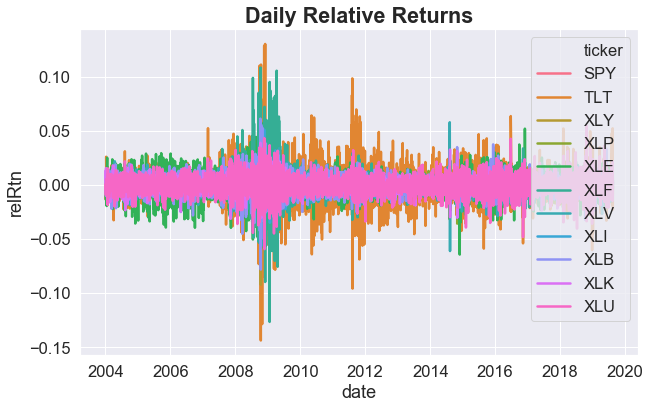

In [60]:
sns.set_style("darkgrid")
sns.set(rc={'figure.figsize':(10,6)})
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})
snslp = sns.lineplot(x='date', y='relRtn',
                     hue="ticker",
                     data=df)
plt.title("Daily Relative Returns", weight='bold', size = 'large')

Text(0.5, 1.0, 'Close Adjusted Prices')

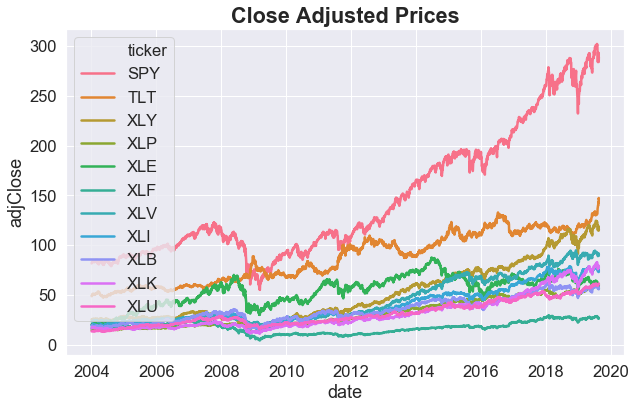

In [18]:
snslp = sns.lineplot(x='date', y='adjClose',
             hue="ticker",
             data=df)

plt.title("Close Adjusted Prices", weight='bold', size = 'large')

Text(0.5, 1.0, 'Absolute Returns')

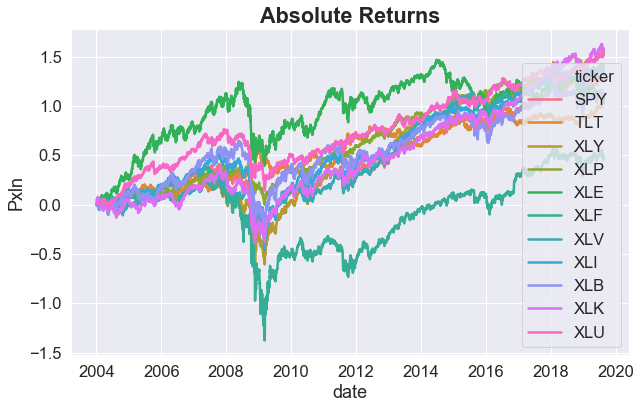

In [61]:
snslp = sns.lineplot(x='date', y='Pxln',
             hue="ticker",
             data=df)

plt.title("Absolute Returns", weight='bold', size = 'large')

Text(0.5, 1.0, 'Rel to SPY Returns')

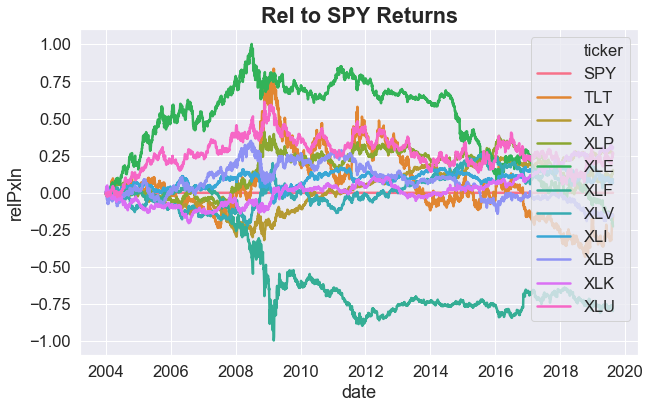

In [62]:
snslp = sns.lineplot(x='date', y='relPxln',
             hue="ticker",
             data=df)

plt.title("Rel to SPY Returns", weight='bold', size = 'large')

# ADF tests on Weekly Returns:

- Results on price or timeseries of Cumulative returns
- Results on weekly absolute returns
- weekly relative returns to SPY
- weekly cummulative relative returns

In [65]:
adf = pd.DataFrame([], index = ['ADF', 'pval', 'ulag', 'n', 'cval'])

#t[3].resols.summary()
for i in tickers[:]:
    c = df[df['ticker'] == i]['Pxln']
    t = list(adfuller(c, maxlag=1, regression='c', autolag = None, regresults=False))
    adf[i+' - Price'] = t[:5]
    c = df[df['ticker'] == i]['clRtn']
    t = list(adfuller(c, maxlag=1, regression='c', autolag = None, regresults=False))
    adf[i+' - Absolute'] = t[:5]
    if i =='SPY':
        continue
    c = df[df['ticker'] == i]['relRtn']
    t = list(adfuller(c, maxlag=1, regression='c', autolag = None, regresults=False))
    adf[i+' - Relative'] = t[:5]
    c = df[df['ticker'] == i]['relPxln']
    t = list(adfuller(c, maxlag=1, regression='c', autolag = None, regresults=False))
    adf[i+' - CIX'] = t[:5]
    
adf = adf.T
adf['1%'] = np.round(adf['cval'][0]['1%'],3)
adf['5%'] = np.round(adf['cval'][1]['5%'],3)
adf['10%'] = np.round(adf['cval'][2]['10%'],3)
print('ADF Test Results on Weekly Returns:')
adf.drop('cval', axis=1)

ADF Test Results on Weekly Returns:


,ADF,pval,ulag,n,1%,5%,10%
SPY - Price,-0.142255,0.945064,1,3931,-3.432,-2.862,-2.567
SPY - Absolute,-49.5303,0,1,3931,-3.432,-2.862,-2.567
TLT - Price,-0.76431,0.829382,1,3931,-3.432,-2.862,-2.567
TLT - Absolute,-45.9717,0,1,3931,-3.432,-2.862,-2.567
TLT - Relative,-47.9835,0,1,3931,-3.432,-2.862,-2.567
TLT - CIX,-2.04044,0.269127,1,3931,-3.432,-2.862,-2.567
XLY - Price,0.121088,0.967472,1,3931,-3.432,-2.862,-2.567
XLY - Absolute,-46.4282,0,1,3931,-3.432,-2.862,-2.567
XLY - Relative,-48.6363,0,1,3931,-3.432,-2.862,-2.567
XLY - CIX,-0.510106,0.890029,1,3931,-3.432,-2.862,-2.567


# Degree of Differentiation Required for stationarity

- We can take price and use fractional differentiation to create a new time series (De Prado 2018)
- This can be done on both Price & Relative Price (CIX) to use in modeling
- Below to find the threshold for differentiation for Price Returns & rerun ADF tests
- This amounts to a mean reverting feature, in this case we use daily return inputs

In [42]:
FFD_cutoff = pd.DataFrame([])
tickers = np.array(['XLY', 'XLP', 'XLE', 'XLF', 'XLV', 'XLI', 'XLB', 'XLK', 'XLU'])
for i in tickers:
    o = plotMinFFD(df[df['ticker'] == i]['rreturns']) 
    o['ticker'] = i
    FFD_cutoff = FFD_cutoff.append(o, ignore_index=True)
FFD_cutoff.head()

,adfStat,pVal,lags,nObs,95% conf,corr,Diff,ticker
0,-0.284460,0.927677,1.0,3926.0,-2.862276,1.000000,0.0,XLY
1,-0.632712,0.863418,1.0,3919.0,-2.862278,0.999928,0.1,XLY
2,-1.219973,0.664945,1.0,3916.0,-2.862278,0.999416,0.2,XLY
3,-1.980432,0.295218,1.0,3915.0,-2.862279,0.997867,0.3,XLY
4,-2.927066,0.042290,1.0,3916.0,-2.862278,0.994731,0.4,XLY


In [43]:
FFD_cutoff.to_csv('data/FWW-FD-relReturns-cutoffs-d.csv')

In [45]:
FFD_cutoff[np.round(FFD_cutoff['Diff'],2) == .4]

,adfStat,pVal,lags,nObs,95% conf,corr,Diff,ticker
4,-2.927066,4.228988e-02,1.0,3916.0,-2.862278,0.994731,0.4,XLY
15,-7.772670,8.835673e-12,1.0,3916.0,-2.862278,0.967876,0.4,XLP
26,-4.254130,5.328644e-04,1.0,3916.0,-2.862278,0.990380,0.4,XLE
37,-3.529083,7.270844e-03,1.0,3916.0,-2.862278,0.993604,0.4,XLF
48,-7.535362,3.490021e-11,1.0,3916.0,-2.862278,0.970144,0.4,XLV
59,-8.955573,8.492497e-15,1.0,3916.0,-2.862278,0.956710,0.4,XLI
70,-6.513235,1.087209e-08,1.0,3916.0,-2.862278,0.976848,0.4,XLB
81,-4.069110,1.088872e-03,1.0,3916.0,-2.862278,0.989370,0.4,XLK
92,-6.880264,1.439464e-09,1.0,3916.0,-2.862278,0.973529,0.4,XLU


In [81]:
c = 0
t = 1e-2
FFD_df = pd.DataFrame([])
print('Fractional feature, ADF test results post transformation (All Data, 2010+, 2015+)')
for i in tickers[tickers != 'SPY']:
    ff = fracDiff_FFD(df[df['ticker'] == i]['relPxln'],
                      .4,
                      thres=1e-2).to_frame()
    ff['ticker'] = i
    FFD_df = FFD_df.append(ff)
    print(i, ff.shape)
    print('ADF Test Stat', 
          np.round(list(adfuller(ff['relPxln'], maxlag=1, 
                                 regression='c', autolag = None))[0],2),
          np.round(list(adfuller(ff.loc[ff.index > datetime(2010, 1, 1)]['relPxln'], 
                                 maxlag=1, regression='c', autolag = None))[0],2),
          np.round(list(adfuller(ff.loc[ff.index > datetime(2015, 1, 1)]['relPxln'], 
                                 maxlag=1, regression='c', autolag = None))[0],2))
    c+= 1
    
FFD_df = FFD_df.rename(columns={"Pxln": "MeanRev-FF"})
FFD_df['date'] = FFD_df.index

Fractional feature, ADF test results post transformation (All Data, 2010+, 2015+)
TLT (3923, 2)
ADF Test Stat -6.71 -4.86 -4.52
XLY (3923, 2)
ADF Test Stat -3.17 -3.85 -5.93
XLP (3923, 2)
ADF Test Stat -5.26 -5.6 -3.31
XLE (3923, 2)
ADF Test Stat -3.46 -1.68 -3.06
XLF (3923, 2)
ADF Test Stat -3.15 -6.49 -5.6
XLV (3923, 2)
ADF Test Stat -5.55 -4.24 -4.86
XLI (3923, 2)
ADF Test Stat -9.32 -9.81 -6.72
XLB (3923, 2)
ADF Test Stat -5.93 -3.71 -4.74
XLK (3923, 2)
ADF Test Stat -4.11 -3.14 -2.58
XLU (3923, 2)
ADF Test Stat -7.97 -7.73 -6.89


# Feature Creation & Data Merge
- we convert our relative daily into log returns, and we measure forward 3m relative returns each day for every equity ticker
- this is converted into a +1/-1 variable for positive and negative
- We create various historical return time periods, 5d, 10d (2 weeks), 21d (1m), 63d, 126d, 252d. These have the nomenclature, rhcc+d or rhcc252 for relative historical 252 days. 
- we also create historical vol features, These have the nomenclature, hv+d or hv252 
- Here we use various technical indicators on our return / price data
- below is the createFeatures function to create all our features tested in our modeling notebook

In [181]:
def createFeatures(df, tickers, cRetFld, dRetFld, dFrac, ids, drops, relFlds = False):
    if type(dFrac) not in [list, float]:
        raise Exception('wrong fractional degree of differentation input')
    if type(dFrac) == list:
        if len(tickers) != len(dFrac):
            raise Exception('dFrac shape != Tickers')
    mdata = pd.DataFrame([])
    c = 0
    
    # Fixed Income Applied to all
    ficols = ['clRtnH252', 'clRtnH126', 'clRtnH021', 'clRtnH010', 
                      'clHv010', 'clHv126','Pxln']
    fidata = df[df['ticker'] == 'TLT'][ficols]
    fidata['FIst6mRealized'] = fidata['clHv010'] - fidata['clHv126']
    fidata['FIRet12m1m'] = fidata['clRtnH252'] -  fidata['clRtnH021']
    fidata['FIRet3m2w'] = fidata['clRtnH126'] -  fidata['clRtnH010']
    FI_FFD_df = fracDiff_FFD(fidata['Pxln'], .5, 
                              thres=1e-2).to_frame().rename(columns={'Pxln': "FIFF"})
    fidata = fidata.merge(FI_FFD_df, how='left', left_index=True, right_index=True)
    fidata['FIRSI14d'], fidata['FIRSIs14d']  = RSI(fidata['Pxln'], window_length = 14, MA = 'S')
    fidata['FIRSI63d'], fidata['FIRSIs63d']  = RSI(fidata['Pxln'], window_length = 63, MA = 'S')
    fidata = fidata[['FIst6mRealized', 'FIRet12m1m', 'FIRet3m2w', 'FIFF', 'FIRSI14d', 'FIRSIs14d',
                    'FIRSI63d', 'FIRSIs63d']]
    
    tmp = [x for x in list(df.columns) if x not in ids]
    tmp = [x for x in tmp if x not in drops]
    for t in tickers:
        tdata = df[df['ticker'] == t][tmp]
        tdf = df[df['ticker'] == t][cRetFld]
        ddf = df[df['ticker'] == t][dRetFld]
        dOHLC = df[df['ticker'] == t][['close', 'high', 'low', 'open']]
        FFD_df = fracDiff_FFD(df[df['ticker'] == t][cRetFld],
                              dFrac[c] if (type(dFrac)==list) else dFrac,
                              thres=1e-2).to_frame().rename(columns={cRetFld: "MeanRevFF"})
        # Create Signals
        tdata['TrendMASlope10'] = tdf.ewm(span=10).mean().diff().rolling(window=5, min_periods=5).mean()
        tdata['TrendMASlope50'] = tdf.ewm(span=50).mean().diff().rolling(window=5, min_periods=5).mean()
        tdata['TrendMASlope100'] = tdf.ewm(span=100).mean().diff().rolling(window=5, min_periods=5).mean()
        tdata['TrendMASlope200'] = tdf.ewm(span=200).mean().diff().rolling(window=5, min_periods=5).mean()
        tdata['MeanRevRSI14d'], tdata['TrendRSIs14d']  = RSI(tdf, window_length = 14, MA = 'S')
        tdata['MeanRevRSI63d'], tdata['TrendRSIs63d']  = RSI(tdf, window_length = 63, MA = 'S')
        tdata['TrendhBma'] = bollinger_hband_indicator(ddf, n = 20).ewm(span=50).mean()
        tdata['TrendlBma'] = (bollinger_lband_indicator(ddf, n = 20)*-1).ewm(span=50).mean()
        tdata['TrendabsBma'] = (tdata['TrendhBma'] - tdata['TrendlBma']).abs()
        tdata['aroon_up'] = aroon_up(tdf, n=50)
        tdata['aroon_down'] = aroon_down(tdf, n=50)
        tdata['aroon_diff'] = tdata['aroon_up'] - tdata['aroon_down']
        tdata['MACD_12_26'] = macd(tdf, n_fast=12, n_slow=26)
        tdata['MACD_diff'] = macd_diff(tdf, n_fast=12, n_slow=26, n_sign=9)
        tdata['MACD_sign'] =  macd_signal(tdf, n_fast=12, n_slow=26, n_sign=9) 
        tdata['MACD_36_78'] = macd(tdf, n_fast=36, n_slow=78)
        tdata['MACD_sign3x'] =  macd_signal(tdf, n_fast=36, n_slow=78, n_sign=27) 
        tdata = tdata.merge(FFD_df, how='left', left_index=True, right_index=True)
        tdata['MeanRevFFEWMA1'] = tdata['MeanRevFF'].ewm(span=20).mean()
        tdata['MeanRevFFEWMA2'] = tdata['MeanRevFF'].ewm(span=200).mean()
        tdata['MeanRevFFDiff'] =  tdata['MeanRevFF'] - tdata['MeanRevFFEWMA1']
        # Vol Features
        tdata['st6mRealized'] = tdata['clHv010'] - tdata['clHv126']

        # Return Momentum Features
        tdata['Ret12m1m'] = tdata['clRtnH252'] -  tdata['clRtnH021']
        tdata['Ret12m6m'] = tdata['clRtnH252'] -  tdata['clRtnH126']
        tdata['Ret6m1m'] = tdata['clRtnH126'] -  tdata['clRtnH021']
        tdata['Ret6m2w'] = tdata['clRtnH126'] -  tdata['clRtnH010']
        tdata['Ret3m2w'] = tdata['clRtnH126'] -  tdata['clRtnH010']
        
        if relFlds == True:
            tdata['st6mRealized-Rel'] = tdata['relHv010'] - tdata['relHv126']
            tdata['Ret12m1m-Rel'] = tdata['relRtnH252'] -  tdata['relRtnH021']
            tdata['Ret12m6m-Rel'] = tdata['relRtnH252'] -  tdata['relRtnH126']
            tdata['Ret6m1m-Rel'] = tdata['relRtnH126'] -  tdata['relRtnH021']
            tdata['Ret6m2w-Rel'] = tdata['relRtnH126'] -  tdata['relRtnH010']
            tdata['Ret3m2w-Rel'] = tdata['relRtnH126'] -  tdata['relRtnH010']

        tdata = tdata.merge(fidata, left_index = True, right_index = True)
        cols = list(tdata.columns)
        tdata = tdata.dropna()
        scaler = MinMaxScaler() #MinMaxScaler StandardScaler                                 
        tdata[cols] = scaler.fit_transform(tdata)                      
        tdata['ticker'] = t
        tdata['period'] = df[df['ticker'] == t]['period']
        
        # Unscaled Values
        _s2 = df[df['ticker'] == 'TLT']['relRtnH010']
        tdata['rCorr'] = df[df['ticker'] == t]['relRtnH010'].rolling(126).corr(_s2)
        mdata = mdata.append(tdata, ignore_index=True)
        c+=1

    mdata = mdata.merge(df[ids].reset_index(drop=True), 
                        on=['period', 'ticker'], 
                        how='left')
    mdata.index = mdata['period']

    # Melt
    mmdata = pd.melt(mdata, 
                      id_vars=ids, 
                      value_vars=[x for x in list(mdata.columns) if x not in ids])
    
    return mdata, mmdata

In [183]:
ids_ = ['period', 'ticker', 'forwardmmS', 'forwardstdS', 
          retwindow, 'Side'+retwindow, 'relRtn', 'clRtn']
drops_ = ['Pxln', 'relPxln',
          'open', 'high', 'low', 'close',
          'adjClose', 'adjHigh', 'adjLow', 'adjOpen', 'adjVolume',
          'divCash', 'index', 'splitFactor', 'volume', 'date']
mdata, mmdata = createFeatures(sides,  
                               tickers[tickers != 'SPY'], 'relPxln', 'clRtn',
                               .4, ids_, drops_,
                               relFlds = True)

In [184]:
print(mdata.shape)
print(mmdata['variable'].unique())
mmdata.head()

(35790, 72)
['clHv010' 'clHv021' 'clHv063' 'clHv126' 'clHv252' 'clRtnH010' 'clRtnH021'
 'clRtnH063' 'clRtnH126' 'clRtnH252' 'relHv010' 'relHv021' 'relHv063'
 'relHv126' 'relHv252' 'relRtnH010' 'relRtnH021' 'relRtnH063' 'relRtnH126'
 'relRtnH252' 'TrendMASlope10' 'TrendMASlope50' 'TrendMASlope100'
 'TrendMASlope200' 'MeanRevRSI14d' 'TrendRSIs14d' 'MeanRevRSI63d'
 'TrendRSIs63d' 'TrendhBma' 'TrendlBma' 'TrendabsBma' 'aroon_up'
 'aroon_down' 'aroon_diff' 'MACD_12_26' 'MACD_diff' 'MACD_sign'
 'MACD_36_78' 'MACD_sign3x' 'MeanRevFF' 'MeanRevFFEWMA1' 'MeanRevFFEWMA2'
 'MeanRevFFDiff' 'st6mRealized' 'Ret12m1m' 'Ret12m6m' 'Ret6m1m' 'Ret6m2w'
 'Ret3m2w' 'st6mRealized-Rel' 'Ret12m1m-Rel' 'Ret12m6m-Rel' 'Ret6m1m-Rel'
 'Ret6m2w-Rel' 'Ret3m2w-Rel' 'FIst6mRealized' 'FIRet12m1m' 'FIRet3m2w'
 'FIFF' 'FIRSI14d' 'FIRSIs14d' 'FIRSI63d' 'FIRSIs63d' 'rCorr']


,period,ticker,forwardmmS,forwardstdS,relRtnF063,SiderelRtnF063,relRtn,clRtn,variable,value
0,2005-05-31,TLT,0.400635,-0.112181,-0.015821,-1.0,0.018710,0.012286,clHv010,0.156783
1,2005-06-01,TLT,0.407630,-0.042606,-0.007935,-1.0,0.003710,0.012128,clHv010,0.185373
2,2005-06-02,TLT,0.403771,-0.080989,-0.012285,-1.0,0.000159,0.002398,clHv010,0.181738
3,2005-06-03,TLT,0.401920,-0.099398,-0.014372,-1.0,-0.003196,-0.008260,clHv010,0.209608
4,2005-06-06,TLT,0.398804,-0.130391,-0.017885,-1.0,0.006152,0.005236,clHv010,0.211002


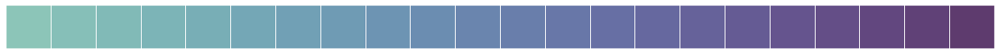

In [149]:
cmap = sns.cubehelix_palette(22, start=1,rot=-.80, dark = .3, light=.7)
sns.palplot(cmap)

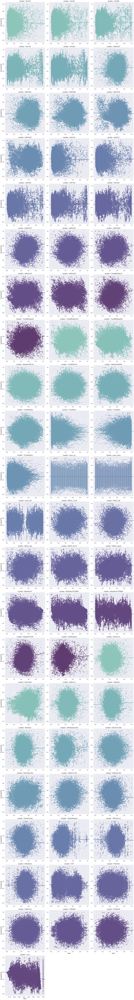

In [188]:
sns.set_style("darkgrid")
sns.set(rc={'figure.figsize':(40,40)})
sns.set_context("notebook", font_scale=1.5, rc={"lines.linewidth": 2.5})
g = sns.FacetGrid(mmdata, col="variable", hue="variable",
                  palette=cmap,
                  height = 8, 
                  col_wrap = 3,
                  sharex=False, 
                  sharey=False,
                  margin_titles=True)
g.map(sns.regplot,'value', 'forwardmmS')
g.savefig('plots/RelativeReturnsScatterPlots-3M.png')

In [185]:
df_stats = pd.DataFrame([], columns = ['pval', 'rsquared', 'coef'])
for i in mmdata.variable.unique():
    form = "forwardmmS ~ "+str(i)
    model = ols(form, mdata).fit()
    df_stats.loc[i, :] = [np.round(model.pvalues[1],4), 
                              np.round(model.rsquared, 4), 
                              np.round(model.params[1],3)]

df_stats.sort_values(by=['rsquared'], ascending = False)

,pval,rsquared,coef
rCorr,0,0.1198,-0.097
relRtnH010,0,0.0666,0.295
TrendMASlope50,0,0.0654,0.224
MACD_12_26,0,0.0578,0.217
TrendMASlope10,0,0.0569,0.251
TrendMASlope100,0,0.0543,0.185
MACD_sign,0,0.0459,0.191
MeanRevFFDiff,0,0.0434,0.268
relRtnH063,0,0.0431,0.206
relRtnH021,0,0.0402,0.217


In [186]:
mdata.to_csv('data/mdata.csv')

In [187]:
cols = list(mmdata['variable'].unique())
with open('data/fnamesR.txt', 'w') as f:
    for s in cols:
        f.write(s + '\n')

In [189]:
!jupyter nbconvert --to html EDA_s0.ipynb

[NbConvertApp] Converting notebook EDA_s0.ipynb to html
[NbConvertApp] Writing 911310 bytes to EDA_s0.html
